 <a href="https://www.audiolabs-erlangen.de"><div style="position: relative;"><img style="position: relative;" src="https://www.audiolabs-erlangen.de/assets/images/banner.jpg" width=1000><span style='position: absolute; top: 35px; left: 0px; color: white; font-size: 20px; letter-spacing: 1.9px; text-transform: uppercase; font-family: Helvetica, sans-serif; text-decoration-style: solid; padding: 10px;'>International Audio Laboratories Erlangen</span><img style="position: absolute; top: 0px; right: 0px;" src="https://www.audiolabs-erlangen.de/assets/images/alabs.svg" width=180></div></a>

------------------------------------------------------------------------
**Professor:**<br>
Prof. Dr. ir. Emanuël Habets
<br>
[emanuel.habets@audiolabs-erlangen.de](emanuel.habets@audiolabs-erlangen.de)


**Authors:**

Wolfgang Mack

**Tutors:**

Wolfgang Mack,
Adrian Herzog

**Contact:**

Wolfgang Mack,<br>
[wolfgang.mack@audiolabs-erlangen.de](wolfgang.mack@audiolabs-erlangen.de)
<br>
Adrian Herzog<br>
[adrian.herzog@audiolabs-erlangen.de](adrian.herzog@audiolabs-erlangen.de)


Friedrich-Alexander Universität Erlangen-Nürnberg

International Audio Laboratories Erlangen

Am Wolfsmantel 33, 91058 Erlangen

# Python: How to ...
- perform a elementwise product
- compute a power spectral density (PSD) matrix with the matrix product

In [1]:
# Installation of required packages
!pip install librosa==0.6 soundfile

Processing /home/aplab13/.cache/pip/wheels/d3/e7/ad/add2601223ec9c317a08955ba6131bc5aac3931061d4740c6b/librosa-0.6.0-py3-none-any.whl
  Using cached SoundFile-0.10.3.post1-py2.py3-none-any.whl (21 kB)
Processing /home/aplab13/.cache/pip/wheels/6f/d1/5d/f13da53b1dcbc2624ff548456c9ffb526c914f53c12c318bb4/resampy-0.2.2-py3-none-any.whl
Processing /home/aplab13/.cache/pip/wheels/49/5a/e4/df590783499a992a88de6c0898991d1167453a3196d0d1eeb7/audioread-2.1.9-py3-none-any.whl


In [2]:
# just some basic imports
import numpy as np
import matplotlib.pyplot as plt
import soundfile as sf
from librosa.core import stft, istft, resample

In [3]:
# make matrix a with specific shape
a = np.arange(1,5).reshape((2,2))
print('A\n',a)
print('A.shape\n',a.shape)
# perform a elementwise product of a*a
print('Elementwise Product\n',a*a)
# Matrix Product of last dimension
b = np.arange(6*3*4*5).reshape(6,3,5,4)
#print('B\n',b)
print('B.shape\n',b.shape)
# Compute the matrix product of the last 2 dimensions (e.g. for power spectral density computation)
matprod = b[...,None]@b[...,None,:]
print('Mat-Prod.shape \n',matprod.shape)
#print('Mat-prod \n',matprod)
# conversion to complex NumPy-array
#output = np.asarray(input,dtype=complex)

A
 [[1 2]
 [3 4]]
A.shape
 (2, 2)
Elementwise Product
 [[ 1  4]
 [ 9 16]]
B.shape
 (6, 3, 5, 4)
Mat-Prod.shape 
 (6, 3, 5, 4, 4)


# Speech Enhancement Using Microphone Arrays
The goal of this notebook is to gain insights into speech enhancement techniques using microphone arrays. A code-skeletton is provided which you have to complete. First, a scenario overview is given.

In [4]:
# Visualization and interaction imports
#%matplotlib notebook
%matplotlib inline

# use matplotlib in notebook mode - please do not change to inline, otherwise the kernel has to be restarted
import IPython.display as ipd
from ipywidgets import *

## Abstract
This module is designed to give a practical understanding of performing speech enhancement using microphone arrays. It is is closely related to the lecture 'Speech Enhancement' by Prof. Dr. ir. Emanuël Habets.<br>
In this exercise, you have to implement a commonly used spatial signal processing technique known as beamforming, and analyse the performance of two different beamformers, a signal-independent beamformer known as delay-and-sum beamformer (DSB) and a signal-dependent beamformer known as minimum variance distortionless response (MVDR) beamformer, for a noise and interference reduction task. A free-field scenario is considered, i.e., no reflections or shieldings caused by walls or obstacles are considered. The beamformer performances are compared via objective measures to demonstrate their advantages with respect to the specific reduction task.

## Part 0: Introduction

Microphone arrays play an important role in applications like hands-free communication in smartphones, smart speakers, and teleconferencing systems. The spatial diversity offered by microphone arrays can be used to extract the speech signal of interest from the microphone signals corrupted by noise, reverberation and interfering sources. A typical method for this is to obtain a sum of the filtered microphone signals such that the signal from the so-called look direction is maintained while signals from other directions are attenuated. Such a method is known as beamforming.
This module gives a practical understanding of such methods used to perform speech enhancement. The notebook provides the theoretical background necessary to understand the formulation of the beamforming methods and the practical aspects regarding their implementation.
For the experiments in this module, we consider a scenario where a microphone array on a hands-free device captures two sound sources. Additionally, each microphone signal contains white noise which models the self-noise of the microphone. The white noise is assumed to be uncorrelated between the microphones.
<img src='./pdfs/lab_scenario_overview.png' width='600'>
<figcaption>Figure 1 - Environment scenario with a Uniform Linear Array (ULA), an interferer, a desired source, N uncorrelated noise sources and the 2-dimensional coordinate system.</figcaption> <br>
As illustrated in Figure 1, one of the sources is the desired source and the other is an interferer. The task in this experiment is to process the microphone signals to enhance the speech of the desired source while suppressing the interfering speech and noise. <br>
The enhancement system for this module is illustrated in Figure 2.
<img src='./pdfs/generalworkflow-2.png' width='600'>
<figcaption>Figure 2 - General enhancement system used in this module with number of microphones N, one-sided number of frequency bins K and number of time-frames M. N, K, and M are matrix dimensions.</figcaption> <br>
The microphone signals are first transformed into the time-frequency domain via short-time Fourier transform (STFT) to obtain the input signals for the beamforming algorithms. An overview of the tasks for implementing the different beamformers in this module is given as follows:

-  The first task is to compute the so-called relative transfer function (RTF) vector using the geometric information, i.e., the source and microphone positions. The RTF vector, along with the STFT domain microphone signals, is given as an input for the  implementation of the signal-independent delay-and-sum beamformer (DSB). This is further explained in Part 2.2.<br><br>
- The next task is to compute and apply the DSB to the microphone signals to obtain the filtered output (explained in Part 2.3).<br>
<br>
-  For the signal-dependent minimum variance distortionless response (MVDR) beamformer, we need to compute the power spectral density (PSD) matrices for the desired source, the interference and the noise signal, which is the next task. The PSD matrices are computed using the microphone signals and the ideal masks for each of the above mentioned signals. The ideal mask specifies at which time frequency points the PSD matrix needs to be updated. This is described in Part 2.4.<br>
<br>
-  The next task is to compute the MVDR filter for a free-field RTF model using the RTF vector and the PSD matrix of the undesired (interfering speech + noise) signals, and apply the filter to the input microphone signals to obtain the filtered output. The task is further explained in Part 2.5. <br>
<br>
- The filtered outputs are finally transformed back to the time domain using an inverse STFT. The performance of the different beamforming algorithms is evaluated using objective measures. The objective measures used in this module are interference reduction (IR), noise reduction (NR) and signal distortion index (SDI).

## Part 1: Signal and RTF Model for a Uniform Linear Array
### Part 1.1: Signal Model

To explain the formulation of the beamforming techniques, we first need to define a signal model.
<img src='./pdfs/TDSM.png' width='400'><figcaption> Figure 3 - Signal model for the scenario depicted in Figure 1.</figcaption> <br>

Consider a discrete time-domain signal model (shown in Figure 3), where $\text{N}$ microphones capture the desired source signal and the interference in presence of additive noise. Then the $n$th microphone signal for $n=1, \ldots,N$ is given by:

 \begin{align}
y_n(t) &= g_{n,d}(t) * s_{d}(t) + g_{n,i}(t) * s_{i}(t) + v_n(t),\\
       &= x_{n,d}(t) + x_{n,i}(t) + v_{n}(t),  \tag{1} \label{eq:tdsig}
\end{align}
where $s_{d}(t)$ is the desired source signal and $s_{i}(t)$ is the interfering speech signal. The acoustic impulse responses between the $n$th microphone and the sources are denoted by $g_{n,d}(t)$ and $g_{n,i}(t)$ for the desired and the interfering source, respectively. The variable $v_{n}(t)$ denotes the additive noise. The desired source signal and the interfering speech signal received at the $n$th microphone are denoted by $x_{n,d}(t)$ and $x_{n,i}(t)$, respectively. The sample-time index is represented by $t$ and $*$ denotes linear convolution. Since the frequency characteristics of a speech signal vary over time, the processing of the received signals is done in the time-frequency domain. The time domain signals are transformed to the time-frequency domain via STFT. The STFT representation of (\ref{eq:tdsig}) is given by:

\begin{align}
Y_n(m,k) &= G_{n,d}(m,k) S_{d}(m,k) + G_{n,i}(m,k) S_{i}(m,k) + V_n(m,k), \\  \nonumber
         &= X_{n,d}(m,k) + \underbrace{X_{n,i}(m,k) + V_n(m,k)}_{U_{n}(m,k)},  \nonumber \tag{2}
\end{align}

where the upper-case letters denote the time-frequency domain counterparts of the terms in (\ref{eq:tdsig}) for the $k$th frequency bin, and $m$ denotes the time-frame index. $U_{n}(m,k)$ denotes the undesired signals, which is the sum of the interference and the noise signals. We can express the $N$ STFT domain microphone signals in vector notation as:

\begin{align}
\mathbf{y}(m,k) &= \mathbf{g}_{d}(m,k) S_{d}(m,k) + \mathbf{u}(m,k),  \\
                &= \mathbf{x}_{d}(m,k) + \mathbf{u}(m,k),\nonumber\label{eq:pythagoras}
\tag{3}
\end{align}

where $\mathbf{y}(m,k) = \left[ Y_1(m,k), Y_2(m,k), \ldots, Y_N(m,k) \right]^T$, and $\mathbf{x}_{d}(m,k)$, $\mathbf{g}_{d}(m,k)$ and $\mathbf{u}(m,k)$ are defined similarly.

We can write the desired source signal vector $\mathbf{x}_{d}(m,k)$ as a function of the received signal at the first microphone:

\begin{equation}
\mathbf{x}_{d}(m,k) = \mathbf{d}(m,k) X_{1,d}(m,k).  \tag{4}
\end{equation}

Using this definition, the microphone signals can also be written as

\begin{equation}
\mathbf{y}(m,k) = \mathbf{d}(m,k) X_{1,d}(m,k) + \mathbf{u}(m,k),  \tag{5}
\end{equation}
where d is known as relative transfer function (RTF) vector

### Part 1.2 RTF Model - Free-field Model
For the given signal model, we consider a <i>free-field model</i> where each microphone receives only the direct path signal. The RTF effects are modelled by the RTF vector $\mathbf{d}(m,k)$. The formulation of the RTF vector is described as follows.


The free-field model is illustrated in Figure 1. The vector of acoustic transfer functions for the desired source is denoted by $\mathbf{g}_{d}(k) = \left[ G_{1,d}(k), G_{2,d}(k), \ldots, G_{N,d}(k) \right]^T$. The acoustic transfer function corresponding to the $n$th microphone is given by

\begin{equation}
G_{n,d}(k) = A_{n,d}(k)\text{exp} \left(j 2 \pi f_k {\tau_{n,d}} \right),  \tag{6}
\end{equation}

where $A_{n,d}(k)$ is the attenuation factor for the $n$th microphone due to, e.g., distance attenuation, $f_{k} = \frac{k}{K} f_{s}$ denotes the frequency value corresponding to the $k$th frequency bin, and $\tau_{n,d}$ is the propagation time of the desired source signal to the $n$th microphone. The symbols $f_{s}$ and $K$ denote the sampling frequency and the total number of frequency bins, respectively. The RTF vector for the free-field model is given by:

\begin{align}
\mathbf{d}(k) &= \frac{\mathbf{g}_{d}(k)}{G_{1,d}(k)}\\
                &= \left[ 1, D_2(k), \ldots, D_N(k) \right]^T ,  \tag{7}\label{eq:ddef_frfld}
\end{align}

with

\begin{equation}
D_n(k) = \frac{G_{n,d}(k)}{G_{1,d}(k)} = \frac{A_{n,d}(k)}{A_{1,d}(k)} \text{exp} \left(j 2 \pi f_k \Delta_{\tau_{n,d}} \right),  \tag{8}\label{eq:frfldD}
\end{equation}

where $\Delta_{\tau_{n,d}}$ is the time difference of arrival (TDOA) of the desired signal at the $n$th microphone with respect to the 1st microphone. This is the formulation of the RTF vector considered for the delay and sum beamformer, and the MVDR beamformer. In the free-field model, the relative transfer functions are considered to be time-independent.

### Part 1.3 Far-Field Model with an Uniform Linear Array

The microphone array is assumed to be sufficiently distant to the desired source and to be sufficiently small to approximate the circular sound waves at the microphones as plane wave as illustrated in Figure 4a.
<img src='./pdfs/lab_far_field_and_ula.png' width='600'><figcaption>Figure 4 - Far Field Model (a) and Uniform Linear Array (ULA)</figcaption>

The microphone array in this module is an Uniform Linear Array (ULA) as illustrated in Figure 4b. N microphones are equidistantly stacked in a row with inter-microphone distance d. We assign indices in a rising order to the microphones starting with 1 (the furthest at the left) which we refer to as reference microphone. <br>
Further calculations require an orientation of the ULA in the 2-dimensional vector-space defined in Figure 1. For this purpose, we define the unit-norm vector <b>ULA_direction</b> to point from microphone 1 to N in the coordinates of the defined vector-space.<br>
Figure 5 shows a summary of a wave traveling from a source to a ULA with regard to our assumptions (Far-Field, Free-Field, small ULA).

<img src='./pdfs/lab_angle_theta.png' width='600'><figcaption>Figure 5 - Summary of a ULA in a Free-Field and Far-Field Model</figcaption>

<figcaption>Video 1 - A Micophone Array in Near-Field (orange circles) and one in Far-Field (black circles) Distance to a Sound Source</figcaption>
<video controls src="./pdfs/circularwave.mp4">

<figcaption>Video 2 - A Plane Sine Wave Reaching Microphones (Spheres) as it is Assumed in the Far-Field</figcaption>
<video controls src="./pdfs/PlaneWave.mp4">

We define the angle theta in Figure 5 as direction of arrival (DOA) of the desired source. It is the angle between <b>ULA_direction</b> and the normal vector of the arriving wave front, denoted by $source_{dir}$ pointing in the source direction. According to the plane wave model, the DOA is equal for all microphones in the ULA. However, in reality, the incoming wave is not exactly plane but slightly curved because the distance between the desired source and the ULA is finite. To reduce the error coming from the model, the DOA is defined with respect to the ULA center. In practice the DOA is calculated as angle between the vector pointing from the ULA center to the source position and <b>ULA_direction</b>.

Given the DOA, the TDOA and the RTF vector defined in (8) can be calculated. The scenario allows to compute the TDOA with trigonometric functions (sine, cosine) given the DOA, the inter-microphone distance d, and the speed of sound c. The TDOA is used later to construct the RTF vector and eventually to compute the beamformer weights.

<div class="alert alert-block alert-warning">
<b>Homework Exercise 1</b>


- <b>1.1</b> Derive a formula for the `TDOA` between the first and the second microphone based on `theta` and the inter-microphone distance `d`. Calculate the `TDOA` between the first and the third microphone for `c`$ =343 \frac{m}{s}$, `d`$=0.05 m$ and `theta`$  = \frac{pi}{4}$. <br>
  Hint: Look at the triangle with the angle `theta` in Figure 5. Can you construct a similar one with `d` and `theta`?

- <b>1.2</b> How is the `TDOA` between the microphones one and two related to the TDOA between the microphones 1 and 3 or 1 and `N`? Derive the relation.
</div>

<div class="alert alert-block alert-warning">
<b>Homework Exercise 2</b>

Given the desired source position <samp><b>source_pos</b></samp>, the ULA center position <b>`ULA_center`</b>, and <b>`ULA_direction`</b>, derive a formula for `theta` according to Figure 5. Remember, `theta` is equal for all microphones in the ULA.
</div>

<div class="alert alert-block alert-info">
<b>Lab Experiment 1</b>

Implement <samp> compute_doa(...)</samp>.



Input parameters:<br>
<b>`source_pos`</b>:  numpy array with the X and Y value of the desired source position<br>
<b>`ULA_center`</b>:  numpy array with the X and Y value of the ULA center<br>
<b>`ULA_direction`</b>: unit-norm numpy array with 2 elements defining the endfire ULA orientation (left to right) <br>
Output parameters:<br>
 `theta`:scalar angle between the vector pointing from the ULA center to the desired source and <b>`ULA_direction`</b> </div>

In [5]:
def compute_doa(source_pos, ULA_center, ULA_direction):
    
    new_sourcepos = source_pos - ULA_center
    scalar_result = np.dot(ULA_direction, new_sourcepos)
    

    norm_new_sourcepos = np.linalg.norm(new_sourcepos,ord=2)
    norm_ULA_direction = np.linalg.norm(ULA_direction,ord=2)
    
    arccos_arg = scalar_result / (norm_new_sourcepos*norm_ULA_direction)
    
    theta = np.arccos(arccos_arg)
    
    # fill in your code here
    return theta

<div class="alert alert-success">
  <strong>Test 1</strong>

Test <samp> compute_doa(...)</samp>:

Is `theta` 45 degree for:

- <b>`source_pos`</b> = np.array([5,5]),

- <b>`ULA_center`</b> = np.array([0,0])

- <b>`ULA_direction`</b> = np.array([1,0])
</div>

In [6]:
assert int(compute_doa(np.array([5,5]), np.array([0,0]), np.array([1,0]))*360/2/np.pi) == 45

<div class="alert alert-block alert-info">
<b>Lab Experiment 2</b>

Compute the time difference of arrival (`TDOA`) of the plane wave front between two microphones (the reference microphone with `TDOA` 0 is the left one) given `theta`, the inter-microphone distance `d`, and speed of sound `c`.



Input parameters:

- `theta`: scalar in radian

- `d`: scalar microphone distance

- `c`: scalar speed of sound

Output parameters:

 `TDOA`: scalar time difference of arrival between two neighboring microphones


Remember: The `TDOA` of each microphone is with respect to microphone 1 according to our definition (see Figure 4 and 5)
 </div>

In [7]:
def compute_tdoa(theta, d, c):
# fill in your code here

    tdoa = (d*np.cos(theta))/c

    return -tdoa




<div class="alert alert-success">
  <strong>Test 2</strong>

Test <samp> compute_tdoa(...)</samp>:

Is `TDOA` =$-1$ for:

- `theta` = $\frac{\pi}{4}$,
- `d` = 0.343
- `c` = 343

For which `theta` do you expect `TDOA` to be 0? Try it!
</div>

In [8]:
theta = np.pi/4
d = 0.343 # 34.3 cm is a very high distance (not typical)
c = 343   # The speed of sound
assert round(compute_tdoa(theta,d,c),10) == -0.0007071068
# Fill in the theta for which the tdoa is zero

# 90 GRAD
theta = np.pi/2
assert round(compute_tdoa(theta,d,c),10) == 0

<div class="alert alert-block alert-info">
<b>Lab Experiment 3</b>

Given the `TDOA` between two neighboring microphones, compute the `TDOA` of all microphones to the first microphone given a ULA (same distance between all microphones in the array, hence, same relative `TDOA` between neighboring microphones).


Input parameters:

- `TDOA`: time difference of arrival of a plane wave (from left to right)
- `N`: total number of microphones in the ULA


Output parameters:

- <b>`tdoas`</b>: array of `TDOA`s of all `N` microphones with respect to the first one. The first value is 0 as the `TDOA` from the first to the first microphone is 0. The shape is (N,).
 </div>

In [9]:
def compute_tdoas(tdoa, N):
    # fill in your code here
    
    tdoa_array = np.array( range(N) ) * tdoa
    
    return tdoa_array
        
        
    

<div class="alert alert-success">

  <strong>Test 3</strong>

Test <samp> compute_tdoa_list(...)</samp>:

Is `tdoa_list` =$[0.0,0.1,0.2,0.3]$ for:

- `tdoa` = 0.1
- `N` = 4,

i.e., a microphone array of four microphones and a time difference of arrival between neighboring microphones of 0.1 seconds

</div>

In [10]:
assert[ round(tdoa,2) for tdoa in compute_tdoas(0.1,4)] == [0.0, 0.1, 0.2, 0.3]

## Part 2 Beamforming
### 2.1 How to Apply Beamformers
Our aim is to obtain an estimate of the desired source signal at the first microphone, i.e., ${X}_{1,d}(m,k)$.
<img src='./pdfs/BF.png' width='400'><figcaption>Figure 6 - General block diagram for a beamformer.</figcaption> <br><br>
This is done by applying a spatial filter to the observed microphone signals and summing across the array elements (shown in Figure 6) and is given by:

\begin{equation}
\widehat{X}_{1,d}(m,k) = \mathbf{h}^{H}(m,k) \mathbf{y}(m,k), \nonumber \tag{9}
\end{equation}

where $\mathbf{h}(m,k) = \left[ H_{1}^{*}(m,k), H_{2}^{*}(m,k), \ldots, H_{N}^{*}(m,k) \right]^{T}$ is a filter of length $N$ and $(\cdot)^{\text{H}}$ denotes the conjugate transpose or the Hermitian of a vector/matrix. Now, with the given framework the aim is to develop an analytic expression for the filter $\mathbf{h}(m,k)$, which is given by the different beamforming techniques explained in the Parts 2.3 and 2.5.

## 2.2 Relative Transfer Function Vector
The RTF vector $\mathbf{d}(k)$ is required to compute the beamformer filters in this module.<br>
<div class="alert alert-block alert-warning">
<b>Homework Exercise 3</b><br>
 Using the expressions for $\mathbf{d}(k)$ and its elements, given in Eq. (7) and Eq. (8), write a simplified expression for $\mathbf{d}(k)$. Assume an attenuation free scenario.

</div>


For sources with a fixed position, $\mathbf{d}(k)$ is frequency dependent but time independent.

<div class="alert alert-block alert-info">
<b>Lab Experiment 4</b>

Given <b>`tdoas`</b>, the free-field RTF vector can be computed for all frequencies according to the equation derived in the previous Homework.

Implement <samp> compute_RTF_for_freq(<b>`frequencies`</b> ,<b> `tdoas`</b>) </samp>.



Input parameters:

- <b>`frequencies`</b>: frequencies to compute the RTF vector for<br>
    <b>`tdoas`</b>: array of the time of arrival differences (scalars) of a plane wave from source direction at the microphones

Output parameters:

 - <b>`RTF_vec`</b>: array containing the phase shifts for each microphone with respect to the first microphone for all frequencies (so the shape is (K,N))

 </div>

In [26]:
def compute_RTF_for_freq(frequencies, tdoas):
    # fill in your code here
    
    #catch 0d numpy array case...
    if frequencies.size != 1:
        size_K = np.shape(frequencies)[0]
    else:
        size_K = 1
   
    if tdoas.size != 1:
        size_N = np.shape(tdoas)[0]
    else:
        size_N = 1
    
    
    RTF_Matrix = np.zeros((size_K , size_N), dtype=complex)
    
    
    if size_K==1:
        
        for n in range(size_N):
            RTF_Matrix[0,n] = np.exp(1j*2*np.pi*frequencies*tdoas[n])
            
        return RTF_Matrix



    
    for k in range(size_K):
    
        for n in range(size_N):
            
            RTF_Matrix[k,n] = np.exp(1j*2*np.pi*frequencies[k]*tdoas[n])
    
    
    
    return RTF_Matrix
    ######### ???????????? IST DAS HIER RICHTIG ???????????? ##########
    
#test = compute_RTF_for_freq(np.array([0]),np.array([0,1,2,3]))


<div class="alert alert-success">

  <strong>Test 4</strong>

Test <samp>compute_RTF_for_freq(frequencies, tdoa_list)</samp>:

Is `RTF_vec`.shape =$(1,4)$ in the next cell ?

</div>

In [12]:
assert compute_RTF_for_freq(np.array([0]),np.array([0,1,2,3])).shape == (1,4)

<div class="alert alert-block alert-warning">
<b>Homework Exercise 4</b><br>
Draw a flow chart with the steps to compute the RTF vector.
</div>

<div class="alert alert-block alert-info">
<b>Lab Experiment 5</b>

Use the flow chart of Homework Exercise 4 and the functions you implemented in the previous Lab Experiments to program
    <samp> compute_RTF_vector(<b>`source_pos`</b>, <b>`ULA_center`</b>, <b>`ULA_direction`</b>, <b>`frequencies`</b>, `d`, `c`, `N`)</samp>.


Input parameters:

- See documentation above

Output parameters:

- <b>`RTF_vecs`</b>: array containing all the RTF vectors for all frequencies. It is of shape (K,N).
 </div>

In [13]:
def compute_RTF_vector(source_pos, ULA_center, ULA_direction, frequencies, d, c, N):
    # fill in your code here
    
    
    theta = compute_doa(source_pos, ULA_center, ULA_direction)
    
    tdoa = compute_tdoa(theta, d, c)
    
    tdoas = compute_tdoas(tdoa, N)
    
    RTF_vecs = compute_RTF_for_freq(frequencies, tdoas)
    
    return RTF_vecs

## Part 2.3 Delay and Sum Beamformer

The delay and sum beamformer (DSB) is a fixed beamformer, i.e., the parameters of the beamformer are time-invariant and signal independent. They depend on the desired source and the ULA center positions. As the name suggests, this beamformer works by delaying the signals from certain microphones and then summing them afterwards. To explain this further, consider an array of $N$ microphones. When the microphone array picks up a signal coming from an angle other than 90 degrees, every consecutive microphone receives the signal with positive or negative delay. This is because the signal entering from an angle needs to travel an additional distance to the next microphone in the array. This fact is exploited here to obtain a constructive interference in terms of the desired signal and a destructive interference in terms of the signals from noise or interfering sources.

To obtain a constructive interference in terms of the desired source, the filter needs to satisfy

\begin{equation}
\mathbf{h}^{H}(k) \mathbf{d}(k) = 1, \label{eq:DSBcon}\tag{10}
\end{equation}


where $\mathbf{d}(k)$ is the RTF vector for the free-field model, given in Part 1.2.

Given the RTF vector from Part 2.2, the next task is to apply the DSB filter. Using the condition given in Equation \ref{eq:DSBcon}, the DSB filter is given by:

\begin{equation}\label{eq:appdsb}
\mathbf{h}(k) = \frac{1}{N}\mathbf{d}(k). \tag{11}
\end{equation}



To explain $\mathbf{h}(k)$ further, consider a single frequency k as plane wave which is captured by a ULA as in Figure 7.

<img src='./pdfs/lab_single_plane_sine.png' width='1000'><figcaption>Figure 7 - A single sine captured by a ULA</figcaption> <br><br>

The ULA spatially samples the sine synchronously with N microphones yielding points with different phase offsets with respect to the first microphone due to the spatial diversity of the microphones. All phase offsets are multiples of the first phase offset between the first and the second microphone because of the plane wave assumption. These phase offsets are related to the <samp>`TDOA`</samp> and can be translated into the RTF vector $\mathbf{d}(k)$.   <br>
The general idea of the DSB is to correct the phase offset (delay the signal) by multiplying the microphone spectra with complex exponential functions (the DSB weights) to obtain constructive interference for the desired signal in the consecutive averaging step over the microphone spectra.

<div class="alert alert-block alert-info">
<b>Lab Experiment 6</b>

Implement the function <samp>compute_dsb_weight(<b>`RTF_vecs`</b>)</samp> which computes the time and signal invariant DSB weight-matrix.


Input parameters:

- <b>`RTF_vecs`</b>: array of the RTF vector of each frequency. The array is of shape (`K`,`N`).

Output parameters:

- <b>`dsb_weights`</b>: matrix of the dsb weights of each frequency with the shape (`K`,`N`)
 </div>

In [14]:
def compute_dsb_weight(RTF_vecs, N):
    
    RTF_Matrix = RTF_vecs
    dsb_weights = RTF_Matrix / N
    
    
    
    return dsb_weights
    
    # NORMALIZE FOR LATER SUMMATION ????????????????????
    
    
    ################## HERMITIAN CONJUGATE ????????? #################

<div class="alert alert-block alert-info">
<b>Lab Experiment 7</b>

Implement the function <samp>apply_dsb_weights(<b>`dsb_weights`</b>, <b>`y`</b>)</samp> which applies the dsb weight matrix to the microphone spectra and returns the enhanced spectrum.


Input parameters:

- <b>`dsb_weights`</b>: matrix of the dsb weights for each frequency with the shape (`1`,`K`, `N`)

- <b>`y`</b>: matrix of the spectra of all `N` microphones of shape (`N`, `K`, `M`) where `M` is the total number of time frames

Output parameters:
- <b>`X_1_hat`</b>: complex matrix of a single enhanced spectrum of shape (`K`, `M`)

Note: A common error is when X_1_hat.dtype is float and not complex!
 </div>

In [23]:
def apply_dsb_weights(dsb_weights, y):
    
    y_shape = np.shape(y)
    N = y_shape[0]
    K = y_shape[1]
    M = y_shape[2]
    
    
    
    X_1_hat = np.zeros((K,M) , dtype=complex)
    
    
    
    #weight_matrix_h = weight_matrix.getH()
    
    #print(y_shape)
    #print(np.shape(weight_matrix_h * y[1,:,:])) # (20 , 100)
    #print(np.shape(X_1_hat)) # (10 , 100)
    
    #loop over timeframes
    for m in range(M):
    
        weights_no_m = dsb_weights[0,:,:] # K,N
        y_no_m = y[:,:,m] # N,K
        
    
        #loop over microphones -> average out
        for n in range(N):

            weights_no_n_m = weights_no_m[:,n] # k
            y_no_n_m = y_no_m[n,:] # k
            
            
            for k in range(K):
                
                
                X_1_hat[k, m] = weights_no_n_m[k] * y_no_n_m[k] # Could also be implemented as inner product of singal and weight vector...
            
    
    return X_1_hat

# goal: 10 , 100

#Just sum individual matrices up ?????????????????

    ################## HERMITIAN CONJUGATE ????????? #################
    


In [16]:
# run this to see whether the shapes are ok
assert apply_dsb_weights(np.ones((1,10,20), dtype = complex), np.ones((20,10,100), dtype = complex)).shape == (10,100)

You implemented all relevant functions for the DSB. To compare different beamformer parameters, a class environment is defined. We store all relevant parameter information in it (source position, ULA position, ...). You do not have to change anything here.

In [17]:
class environment():
    def __init__(self,
                 # Number of microphones
                 number_of_microphones = int(4),
                 # Distance between microphones in [m]
                 inter_microphone_distance = 0.05,
                 # speed of sound in [m/s]
                 speed_of_sound= 343,
                 # global signal-to-noise ratio in db
                 SNR= 10,
                 # position of the desired speaker (X,Y)
                 source_pos = np.array([5,5]),
                 # position of the undesired speaker
                 interferer_pos = np.array([5, 0]),
                 # position of the center of the microphone array (uniform linear array)
                 ULA_center = np.array([0,0]),
                 # vector in which the microphone array points: in this case it points in X (endfire) direction
                 ULA_direction = np.array([1,0]),
                 fft_size= int(512),
                 fs = 16000,
                 # some beamformer parameter (better keep it ;)
                 num_points = int(500)
                ):

        # set noise and speed of sound
        self.c = speed_of_sound
        self.SNR = SNR

        #set positional and array parameters
        self.N = number_of_microphones
        self.d = inter_microphone_distance
        self.s = source_pos
        self.intf = interferer_pos
        self.ULA_center = ULA_center
        self.ULA_direction = ULA_direction/np.linalg.norm(ULA_direction)

        # set fft parameters
        self.os_fft_bins = fft_size/2+1
        self.f_max = fs/2
        self.freqs = np.array(np.linspace(0, int(self.f_max), int(self.os_fft_bins)))

        # set beam_pattern parameters
        self.num_points = num_points

Now we define a class Beamformer which contains an environment and a weights matrix. The class DSB extends the class Beamformer and contains functions to compute the beamformer weights and to apply them. You already implemented those.

In [18]:
# We define a class Beamformer to which an environment is assigned (which defines source, microphone position, speed of sound etc.)
# Any Beamformer also has a weights matrix which is used to weight the microphone signals to focus on a certain source/direction
class Beamformer():
    def __init__(self,
                 env
                ):

        # set environment of the DSB
        self.env = env
        # weightlist of DSB. Each list-element stands for a single STFT Frame and has the dimension (fs*k/K x N)
        self.weights = None

# The delay and sum beamformer(DSB) is signal independent. Its weights only depend on the direction of arrival of the desired source signal
# improvement compute weights and apply weights
class DSB(Beamformer):
    def __init__(self,env):
          super().__init__(env)

    def compute_weights(self, RTF_vecs, N):
        self.weights = compute_dsb_weight(RTF_vecs, N)

    def apply_weights(self, mc_stft_spectrum):
        return(apply_dsb_weights(np.expand_dims(self.weights, axis = 0), mc_stft_spectrum))

Three environments are created with different parameters to investigate their impact on the performance. We create three DSBs and assign the environments to them. Finally, we compute the DSB weight matrices.

In [19]:
env0 = environment(SNR = 10, inter_microphone_distance = 0.05, number_of_microphones = 4)
env1 = environment(SNR = 10, inter_microphone_distance = 0.1, number_of_microphones = 4)
env2 = environment(SNR = 10, inter_microphone_distance = 0.05, number_of_microphones = 8)
# create all dsb beamformers needed
dsb0 = DSB(env0)
dsb1 = DSB(env1)
dsb2 = DSB(env2)
# Compute the DSB weights - still without any signals to consider
dsb0.compute_weights(compute_RTF_vector(dsb0.env.s, dsb0.env.ULA_center, dsb0.env.ULA_direction, dsb0.env.freqs, dsb0.env.d, dsb0.env.c, dsb0.env.N), dsb0.env.N)
dsb1.compute_weights(compute_RTF_vector(dsb1.env.s, dsb1.env.ULA_center, dsb1.env.ULA_direction, dsb1.env.freqs, dsb1.env.d, dsb1.env.c, dsb1.env.N), dsb1.env.N)
dsb2.compute_weights(compute_RTF_vector(dsb2.env.s, dsb2.env.ULA_center, dsb2.env.ULA_direction, dsb2.env.freqs, dsb2.env.d, dsb2.env.c, dsb2.env.N), dsb2.env.N)

Some functions to visualize the DSB power patterns are already implemented. Run the cell below and inspect the power patterns of the DSBs.

In [20]:
# Desired and undesired signals are assigned to the environments. (No modification necessary, just run the cell)
from lab_helper import assign_signals_to_environment
assign_signals_to_environment(env0, compute_RTF_vector)
assign_signals_to_environment(env1, compute_RTF_vector)
assign_signals_to_environment(env2, compute_RTF_vector)

## DSB0
N=4<br>
d=0.05

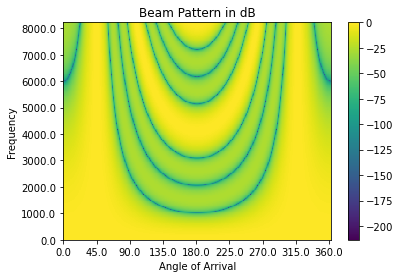

Button(description='Beam-Sweep', style=ButtonStyle())

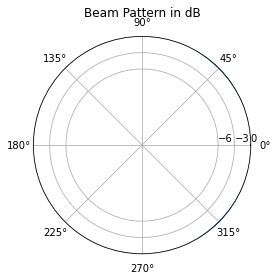

interactive(children=(Dropdown(description='Hz', options=(0.0, 250.0, 500.0, 750.0, 1000.0, 1250.0, 1500.0, 17…

In [21]:
from lab_helper import visualize_dsb_power_pattern
visualize_dsb_power_pattern(dsb0, compute_doa, compute_tdoa, compute_tdoas, compute_RTF_for_freq, compute_RTF_vector)

## DSB1
N=4<br>
d=0.1

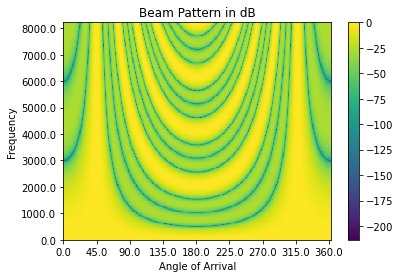

Button(description='Beam-Sweep', style=ButtonStyle())

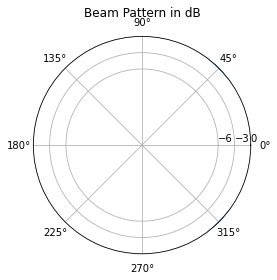

interactive(children=(Dropdown(description='Hz', options=(0.0, 250.0, 500.0, 750.0, 1000.0, 1250.0, 1500.0, 17…

In [22]:
visualize_dsb_power_pattern(dsb1, compute_doa, compute_tdoa, compute_tdoas, compute_RTF_for_freq, compute_RTF_vector)

## DSB2
N=8<br>
d=0.05

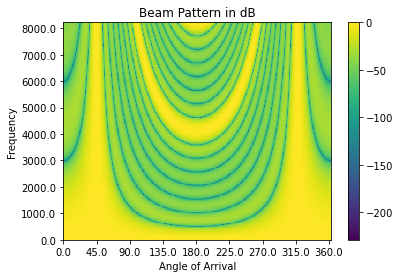

Button(description='Beam-Sweep', style=ButtonStyle())

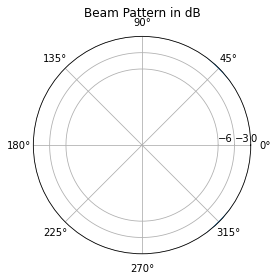

interactive(children=(Dropdown(description='Hz', options=(0.0, 250.0, 500.0, 750.0, 1000.0, 1250.0, 1500.0, 17…

In [23]:
visualize_dsb_power_pattern(dsb2, compute_doa, compute_tdoa, compute_tdoas, compute_RTF_for_freq, compute_RTF_vector)

<div class="alert alert-block alert-info">
<b>Lab Experiment 8</b>

Look at the power patterns. Is the main lobe narrower for a large or small `d`? How does this affect your decision of Homework 5? Could you build a better beamformer if you had more microphones?

In general: If the array apertur is large, is the main lobe broader or narrower?

Describe the trade off between a large array apertur and a small `d` with the results of the module experiments.
 </div>

## Part 2.4 Spatial Aliasing
Spatial aliasing is the result of insufficient spatial sampling of a sound field. It produces angular ambiguities of a beamformer for specific frequencies and relative angles between two DOAs which makes it impossible for the beamformer to perform speech enhancement.<br>
Subsequently, we describe angular ambiguities resulting from the ULA symmetry and spatial aliasing.<br>
Beamformers amplify or attenuate signals dependent on the frequency and the DOA.
<br> <b> Not spatial aliasing:</b> <br>
Given a ULA, the power pattern is symmetric to the ULA axis which results in angular ambiguities, i.e., for ULA beamforming, there is a front-back ambiguity. Beamforming cannot attenuate the interferer if it is placed symmetrical to the desired source w.r.t. the ULA axis. This effect, however, is independent of the wavelength and inter-microphone distance.  <br>
<br>
<br> <b>Spatial aliasing:</b> <br>
For frequencies above a given threshold,
\begin{equation}
\frac{\lambda}{2}\leq d,\tag{12}
\end{equation}
 with the wavelength $\lambda$, there are additional frequency dependent angular ambiguities which are called spatial aliases. Please notice the similarity to the Nyquist theorem for sampling in time domain. Consequently, in spatial domain the theorem is called spatial Nyquist theorem. <br>
Subsequently, we derive spatial aliasing for ULAs and also calculate the angular position of the aliases. <br>
For a given wave length, two DOAs, $\theta_1$ and $\theta_2$, cannot be distinguished if

\begin{equation}
\frac{|d \cdot cos(\theta_1) - d \cdot cos(\theta_2)|}{\lambda} = n \text{ } \forall \text{ }n \text{ }\in \mathbb{N}^+.\tag{13}
\end{equation}

Recapitulate Figure 5 and the calculation of the TDOA. $d \cdot cos(\theta)$  yields the additional distance an incoming plane wave has to travel from microphone to microphone. If the distance difference of two DOAs is a multiple of the wave length, then the beamformer cannot distinguish the DOAs for the specific frequency as they have the same phase offset when wrapped to the range $0$ and $2\pi$. Hence, spatial aliasing occurs. Furthermore, the higher the frequency, the more wave lengths fit into the difference. As a result, the number of spatial aliases increases for higher frequencies. Please consider the ULA symmetry. The difference between $\theta_1$ and $\theta_2$ cannot be greater than $\pi$.

<div class="alert alert-block alert-warning">
<b>Homework Exercise 5</b>

Spatial aliasing occurs if $\frac{\lambda}{2} \leq d$. What to you conclude from this result. Would you select a small or a large `d` to avoid spatial aliasing?
</div>

<div class="alert alert-block alert-warning">
<b>Homework Exercise 6</b><br>
At which wave length appears the second spatial alias if the first one appears at $\lambda = 10 m$. Remember: The first alias appears if the distance difference the two incoming plane waves have to travel in Equation 13 is equal to the wave length.
</div>

<b> Please contact a tutor after you finished this part<br>
Afterwards, listen to some examples :)</b>

## Results DSB0
N= 4
<br>
d=0.05

(257, 401)


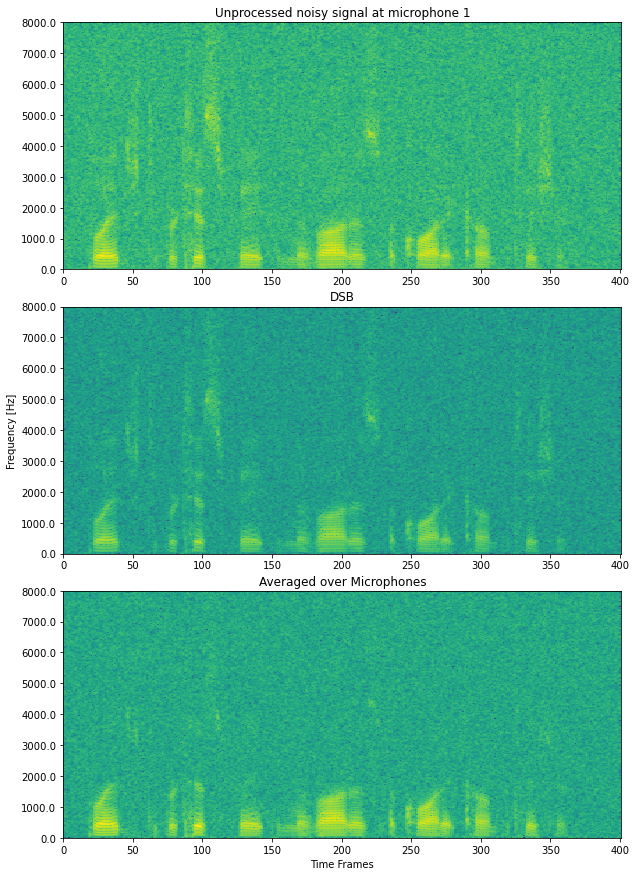

Unprocessed noisy signal at microphone 1


DSB


Averaged Microphone Signals


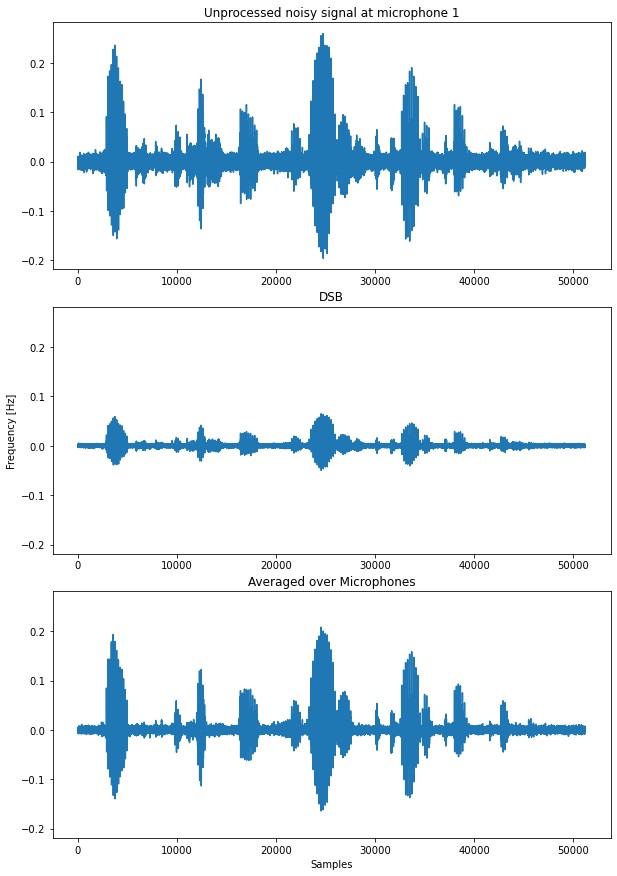

In [24]:
from lab_helper import evaluate_dsb
evaluate_dsb(dsb0, 'dsb0')

## Results DSB1
N = 4 <br>
d = 0.1

(257, 401)


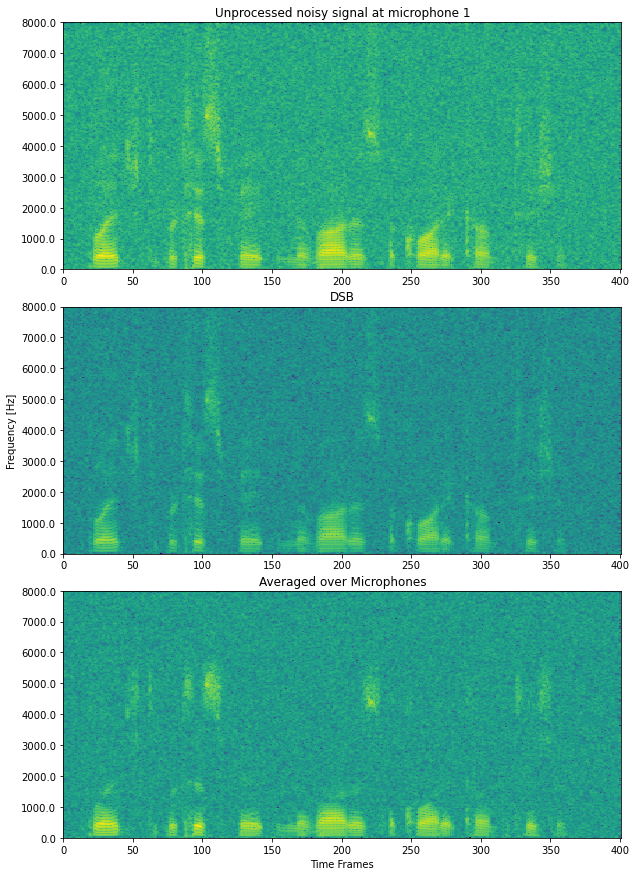

Unprocessed noisy signal at microphone 1


DSB


Averaged Microphone Signals


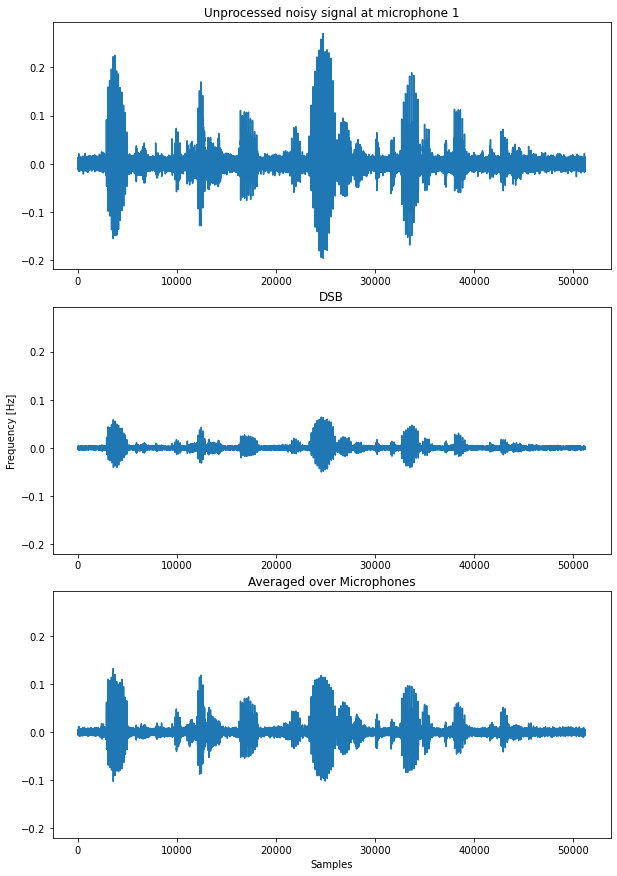

In [25]:
evaluate_dsb(dsb1, 'dsb1')

## Results DSB2
N = 8
<br>
d=0.05

(257, 401)


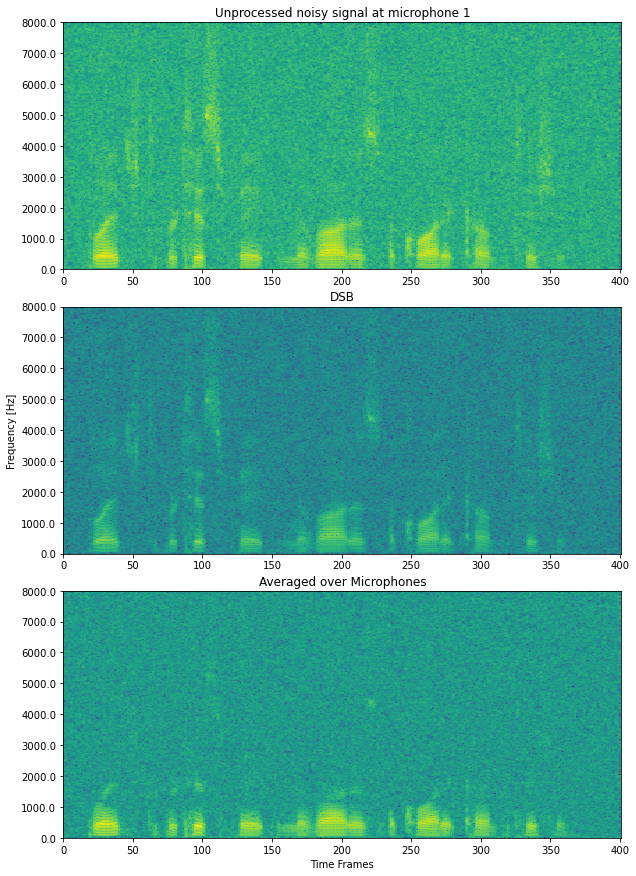

Unprocessed noisy signal at microphone 1


DSB


Averaged Microphone Signals


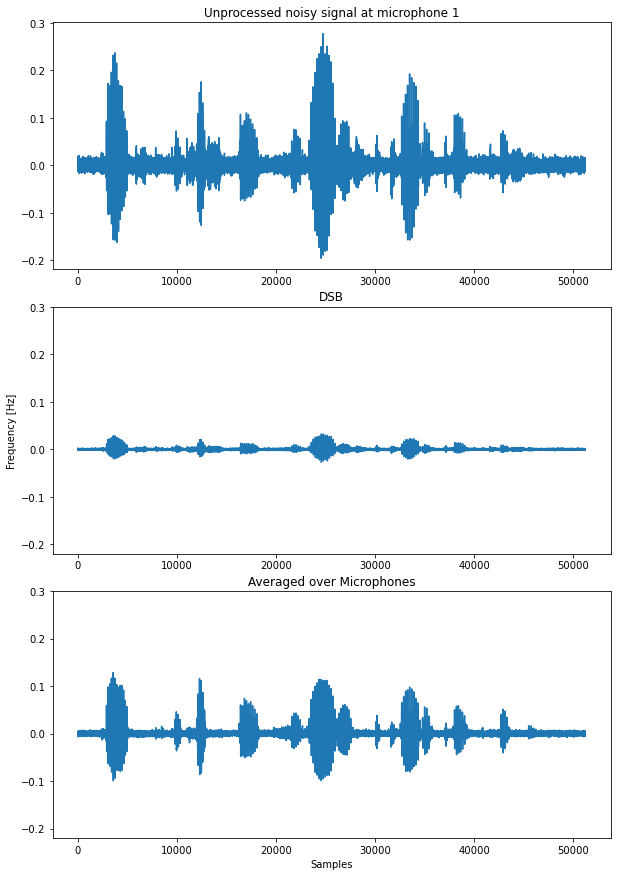

In [26]:
evaluate_dsb(dsb2, 'dsb2')

<div class="alert alert-block alert-info">
<b>Lab Experiment 9</b><br>
Listen to the results above and inspect the spectrograms. To reduce white noise, averaging the microphone signals has the same effect as the DSB. Think about the disadvantage of this method and why the DSB performs better (also for which frequencies and which DOA of the desired source).
 </div>

<div class="alert alert-block alert-info">
<b>Idea:</b><br>
Averaging in low frequencies is okay, because there high wavelengths = low aliasing danger. High frequencies however not well recovered. Results are equivalent if 90 Degree angle to source
 </div>

<div class="alert alert-block alert-info">
<b>Lab Experiment 10</b><br>
The next step is to add an interferer. Who is the interferer, the man or the woman? Listen to the subsequent example where a DSB focuses on one source. Maybe a better beamformer is required?
 </div>

(257, 401)


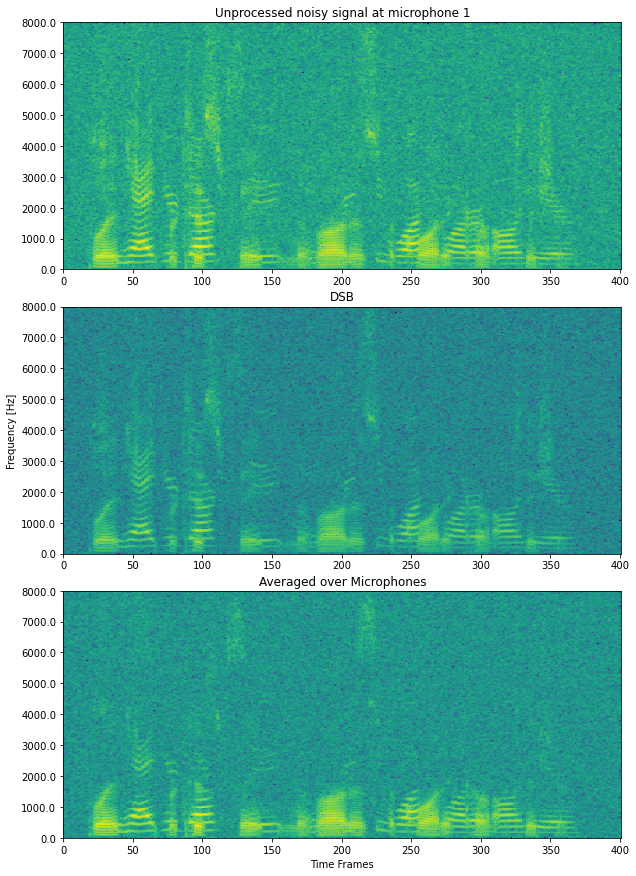

Unprocessed noisy signal at microphone 1


DSB


Averaged Microphone Signals


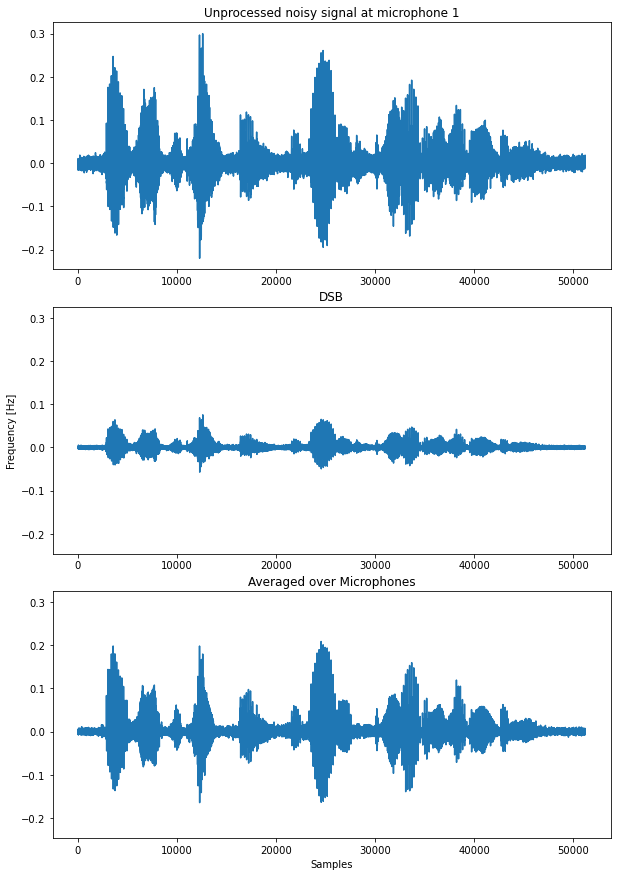

In [27]:
evaluate_dsb(dsb0,'dsb0', interferer=True)

<div class="alert alert-block alert-warning">
<b>Homework Exercise 6</b><br>
Draw a flow chart with the steps to use the DSB. Include the indices of all required formulas for each step.
</div>

### Part 2.5 Minimum variance distortionless response (MVDR) beamformer
The next task is the implementation of the MVDR beamformer. The MVDR beamformer is a signal dependent beamformer i.e. the filter coefficients for the MVDR beamformer depend on the statistical properties of the received signals. The aim of the MVDR beamformer is to minimize the power of the undesired signal components at the output while ensuring that the desired signal is not distorted. Mathematically, this can be formulated as

\begin{equation} \label{eq:mvdropt}
\mathbf{h}_{\text{MVDR}}(m,k) = \operatorname*{arg\,min}_{\mathbf{h}} \mathbf{h}^{H}(m,k) \mathbf{\Phi}_{\mathbf{u}}(m,k) \mathbf{h}(m,k) \; \; \text{subject to} \; \; \mathbf{h}^{H}(m,k) \mathbf{d}(m,k) = 1 , \tag{14}
\end{equation}

where the constraint in the second part ensures a distortionless response. The PSD of the undesired (interfering speech + noise) signals is denoted by $\mathbf{\Phi}_{\mathbf{u}}(m,k)$ and given by:

\begin{equation} \label{eq:psddef}
\mathbf{\Phi}_{\mathbf{u}}(m,k) = \mathcal{E}\{ \mathbf{u}(m,k) \mathbf{u}^{H}(m,k) \}.\tag{15}
\end{equation}

As can be seen Equation 14 is a constrained optimization problem, which can be solved using Lagrange multipliers. The obtained solution is given by:

\begin{equation} \label{eq:mvdr}
\mathbf{h}_{\text{MVDR}}(m,k) = \frac{\mathbf{\Phi}_{\mathbf{u}}^{-1}(m,k) \mathbf{d}(m,k)}{\mathbf{d}^{H}(m,k) \mathbf{\Phi}_{\mathbf{u}}^{-1}(m,k) \mathbf{d}(m,k)} .\tag{16}
\end{equation}

Given this formulation, it can be seen that the estimate of the PSD matrix for the undesired (interfering speech + noise) signals is required to obtain the MVDR filter.

<div class="alert alert-block alert-warning">
<b>Homework Exercise 7</b>

Derive the expression of the MVDR beamformer if
    $\mathbf{\Phi_u}(m,k) = \mathbf{\Phi_n}(m,k)$, where
    $\mathbf{\Phi_n}(m,k)$ is the noise PSD matrix${}^\ast$. For the
    derivation, assume that the noise signals at each microphone are
    spatially uncorrelated, i.e.,
    $\mathbf{\Phi_n}(m,k) = \sigma_n^2(m,k) \mathbf{I}$, denoting
    $\mathbf{I}$ the identity matrix.

Compare the obtained expression to that of the DSB beamformer. Which beamformer is better for white noise reduction?


</div>

<div class="alert alert-block alert-info">
<b>Lab Experiment 11</b><br>

Implement the function <samp>compute_mvdr_weight(<b>`RTF_vecs`</b>, <b>`Phi_u`</b>)</samp> which computes the time and signal dependent MVDR weight-matrix.

Input parameters:

- <b>`RTF_vecs`</b>: array of the RTF vector of each frequency of shape (`K`,`N`)
- <b>`Phi_u`</b>: Array of shape (`M`, `K`, `N`, `N`), with the number of time frames `M`, the number of frequency bins `K`, the number of microphones `N`. For each time frame `m` and each frequency `k`, there is a `N`$\times$`N` PSD matrix.

Output parameters:
- <b>`h`</b>: matrix of the mvdr weights of each frequency with the shape (`M`, `K`, `N`)

 Hint: Inspect the implementation of the weights for the DSB. You can use the function <samp> np.linalg.inv(PSD)</samp> to inverse a single PSD matrix.
 </div>

In [28]:
def compute_mvdr_weight(RTF_vecs,Phi_u):
    
    Phi_u_shape = np.shape(Phi_u)
    M = Phi_u_shape[0]
    K = Phi_u_shape[1]
    N = Phi_u_shape[2]
    
    
    h = np.zeros( (M,K,N) , dtype=complex )
    
    
    #loop over Timeframes
    for m in range(M):
        
        #loop over FreqBins
        for k in range(K):
            
            Phi_u_matrix = Phi_u[m,k,:,:] # (N,N)
            Phi_u_matrix_inv = np.linalg.inv(Phi_u_matrix)  # (N,N)
            
            RTF_vecs_1D = RTF_vecs[k,:].reshape(N,1) # (N,1)
            RTF_vecs_1D_H = RTF_vecs_1D.reshape(1,N).conj() #(1,N)

            numerator = np.dot( Phi_u_matrix_inv , RTF_vecs_1D )
            denominator = np.dot ( np.dot( RTF_vecs_1D_H , Phi_u_matrix_inv) , RTF_vecs_1D )
            
            result = numerator / denominator[0,0]
            h[m,k,:] = result[:,0]
            
    
    return h

    
    

### Power spectral density (PSD) matrix computation
In this module, the task is to implement a general recursive PSD estimation method. This function is later called to estimate the PSD matrices of the desired speech (required later) and undesired (interfering speech + noise) signals.
The theoretical formulation of the recursive estimation method can be given by:
\begin{equation}\label{eq:psdest}
\widehat{\mathbf{\Phi}}(m,k) = \mathcal{I}(m,k) [ \alpha \widehat{\mathbf{\Phi}}(m-1,k) + (1-\alpha) \mathbf{y}(m,k) \mathbf{y}^{H}(m,k)] + (1 - \mathcal{I}(m,k)) \widehat{\mathbf{\Phi}}(m-1,k),\tag{17}
\end{equation}
where $\mathcal{I}(m,k)$ is the indicator parameter mask that is used to determine at which time frequency points the relevant PSD matrix needs to be updated. The mask is different for the desired and undesired signals. If at a certain time-frequency point, the indicator parameter for the desired speech signal is $1$, then the desired speech signal PSD is updated, otherwise if the indicator parameter for the undesired signals is $1$ then the undesired signal PSD is updated. This indicator parameter (mask) is computed using an oracle mechanism and is not a part of the exercise. For practical implementation, Equation \ref{eq:psdest} can be simplified as:

\begin{equation} \label{eq:mainpsdest}
\widehat{\mathbf{\Phi}}(m,k) = \alpha'(m,k) \widehat{\mathbf{\Phi}}(m-1,k) + (1-\alpha'(m,k)) \mathbf{y}(m,k) \mathbf{y}^{H}(m,k),\tag{18}
\end{equation}

where the modified update factor $\alpha'(m,k)$ is given by:

\begin{equation} \label{eq:modalpha}
\alpha'(m,k) = \alpha +(1 - \mathcal{I}(m,k))(1 - \alpha).\tag{19}
\end{equation}

In [29]:
def compute_psd_all(mask, y, env, alpha = 0.9):
    y = y.T
    mask = mask.T
    local_psd = y[...,None]*np.conj(y[...,None,:])
    psd = np.zeros_like(local_psd)
    M, K  = y.shape[:2]
    alpha_dash = compute_alpha_dash(alpha, mask)
    for m in range(M):
        if m < 1:
            psd[m] =  np.asarray([np.identity(env.N)*1e-4]*K, dtype=complex)
        else:
            psd[m] = compute_psd(psd[m - 1,  ...], local_psd[m,...], alpha_dash[m])
    return psd

<div class="alert alert-block alert-info">
<b>Lab Experiment 12</b><br>

Implement the function <samp>compute_alpha_dash(`alpha`, `mask`)</samp>.

Input parameters:

- `alpha`: scalar as defined in the text above.

- <b>`mask`</b>: matrix indicator whether the signals are desired or undesired. It is of shape (`M`,`K`)

Output parameters:
- <b>`alpha_dash`</b>: vector as specified in Eq. 19 of shape (`M`,`K`,`1`,`1`).

 </div>

In [30]:
def compute_alpha_dash(alpha, mask):
    
    mask_shape = np.shape(mask)
    M = mask_shape[0]
    K = mask_shape[1]
    
    #alpha_dash = np.zeros( (M,K,1,1) , dtype=complex )
    alpha_dash_temp = np.zeros( (M,K) )
    
   
    
    
    alpha_dash_temp = alpha * np.ones((M,K)) + ( np.ones((M,K)) - mask ) * (1-alpha)
    
    
    
    alpha_dash = np.zeros( (M,K,1,1) )
    alpha_dash[:,:,0,0] = alpha_dash_temp
    
    
    
    
    return alpha_dash

<div class="alert alert-block alert-info">
<b>Lab Experiment 13</b><br>

Implement the function <samp>compute_psd(<b>`old_psd`</b>,<b>`local_psd`</b>,<b>`alpha_dash`</b>)</samp>.

Input parameters:

- <b>`old_psd`</b>: matrix of shape (K,N,N) of time frame m-1.

- <b>`local_psd`</b>: matrix of shape (K,N,N).

- <b>`alpha_dash`</b>: matrix of shape (K,1,1).

Output parameters:
- <b>`single_psd`</b>: noise psd matrix of time-frame m of shape (K,N,N)

 </div>

In [31]:
def compute_psd(old_psd, local_psd, alpha_dash):
    
    old_psd_shape = np.shape(old_psd)
    K = old_psd_shape[0]
    N = old_psd_shape[1]
    
    single_psd = np.zeros( (K,N,N) , dtype=complex )
    
    
    alpha_dash_vec = alpha_dash[:,0,0]
    
    for k in range(K):
        
        single_psd[k,:,:] = alpha_dash_vec[k] * old_psd[k,:,:] + ( 1-alpha_dash_vec[k] ) * local_psd[k,:,:]
        
    
    return single_psd

In [32]:
assert compute_psd(np.ones((4,3,3)), np.ones((4,3,3)), np.ones((4,1,1))).shape == (4,3,3)

define class mvdr

In [33]:
class MVDR(Beamformer):
    def __init__(self,env):
        super().__init__(env)
        self.Phi_u = None
    def compute_weights(self,RTF_vecs, Phi_u):
        self.weights = compute_mvdr_weight(RTF_vecs, Phi_u)
        self.Phi_u = Phi_u

    def apply_weights(self, y):
        return np.sum(np.conj(self.weights.T)*y, axis = 0)

In [34]:
# compute the weights and apply them
from lab_helper import compute_masks
mvdr0 = MVDR(env0)
mask = compute_masks(mvdr0.env.source_mics, mvdr0.env.noise + mvdr0.env.intf_mics, mvdr0.env)
psd = compute_psd_all(mask, np.asarray([ stft(sig,n_fft=int(mvdr0.env.os_fft_bins*2-2)) for sig in list(mvdr0.env.noised_mix_mics)]), mvdr0.env)
RTF_vecs = compute_RTF_vector(mvdr0.env.s, mvdr0.env.ULA_center, mvdr0.env.ULA_direction, mvdr0.env.freqs, mvdr0.env.d, mvdr0.env.c, mvdr0.env.N)
mvdr0.compute_weights(RTF_vecs, psd)
result = mvdr0.apply_weights(np.asarray([ stft(sig,n_fft=int(mvdr0.env.os_fft_bins*2-2)) for sig in list(mvdr0.env.noised_mix_mics)]))

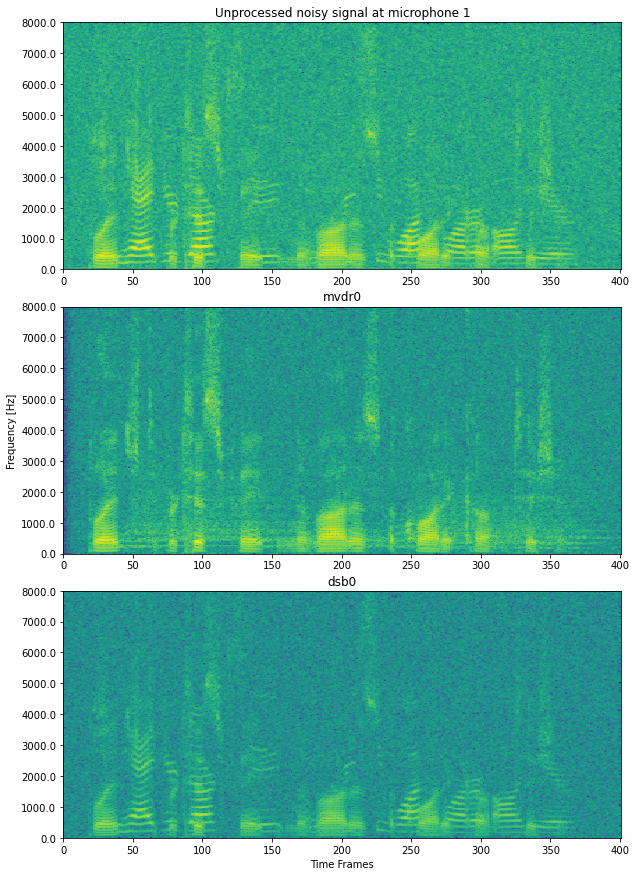

Unprocessed noisy signal at microphone 1


mvdr0


dsb0


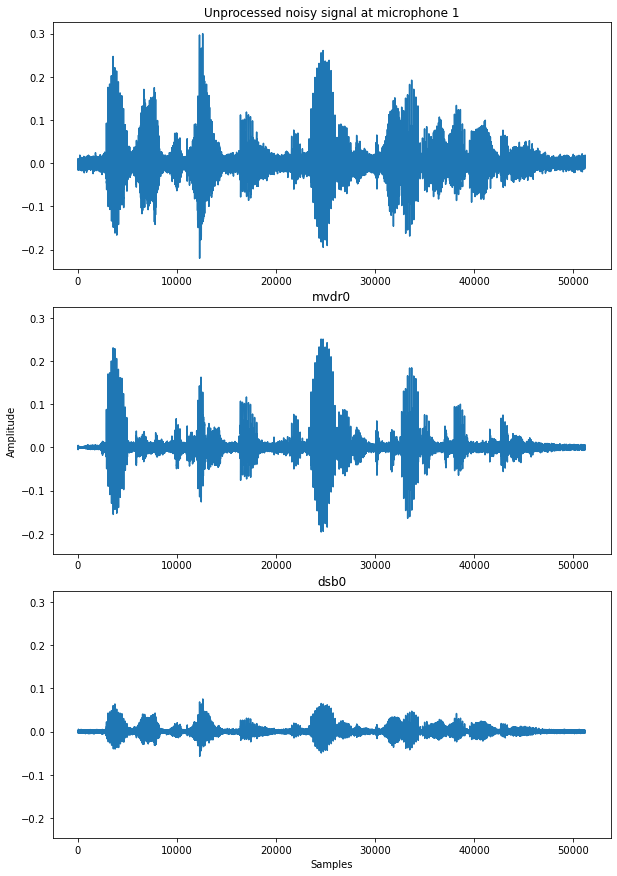

In [35]:
from lab_helper import evaluate_beamformers
evaluate_beamformers(mvdr0, 'mvdr0', dsb0, 'dsb0')

<div class="alert alert-block alert-info">
<b>Lab Experiment 14</b><br>
Who was the interferer? Compare the results to the DSB. The next cell plots the noise output of the DSB and the MVDR. Which one is better?
</div>

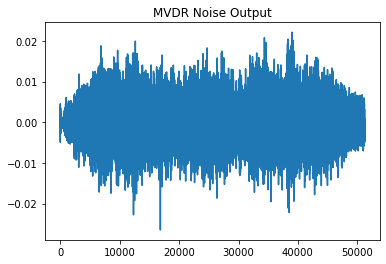

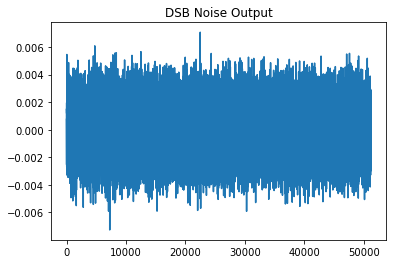

In [36]:
noise_mvdr = mvdr0.apply_weights(np.asarray([ stft(sig,n_fft=int(mvdr0.env.os_fft_bins*2-2)) for sig in list(dsb0.env.noise)]))
noise_dsb = dsb0.apply_weights(np.asarray([ stft(sig,n_fft=int(mvdr0.env.os_fft_bins*2-2)) for sig in list(mvdr0.env.noise)]))
plt.figure()
plt.title('MVDR Noise Output')
plt.plot(istft(noise_mvdr))
plt.figure()
plt.title('DSB Noise Output')
plt.plot(istft(noise_dsb))

<div class="alert alert-block alert-warning">
<b>Homework Exercise 8</b><br>
Draw a flow chart with the steps to use a MVDR. Include the indices of all required formulas for each step.
</div>

### Part 2.6 Performance evaluation measures

The performance of the beamformers is measured in terms of objective
measures. In this module, we use three different objective measures for
the evaluation of the performance of the implemented beamformers. These
measures are explained as follows.

**Interference reduction (IR)** : The first objective measure for
evaluation is the interference reduction. It evaluates the suppression
of the interfering speech signal achieved by the filter. Here, we
compute the average difference between the segmental power of the
interfering clean speech signal and the segmental power of the filtered
version of it. It is formulated as: $$\label{eq:ir}
\text{IR} [ \text{dB}]= \frac{1}{Q} \sum\limits_{q=0}^{Q-1} 10 \log \left( \frac{\sum\limits_{t = qL}^{(q+1)L - 1}(\widehat{x}_{i}(t))^{2}}{\sum\limits_{t = qL}^{(q+1)L - 1}(x_{1,i}(t))^{2}} \right), \tag{20}$$
where $\widehat{x}_{i}(t)$ is the filtered version of the interfering speech
signal and ${x}_{1,i}(t)$ denotes the interfering signal at the
reference microphone. Here, $q$ is the segment index and $L$ denotes the
length of each segment.

**Noise reduction (NR)**: Noise reduction evaluates the suppression of
additive noise achieved at the output. It is computed similarly to the
IR. Instead of the interfering speech signal, we use the noise signal
and its filtered version to evaluate the NR. It is formulated as:
$$\label{eq:nr}
\text{NR} [ \text{dB}]= \frac{1}{Q} \sum\limits_{q=0}^{Q-1} 10 \log \left( \frac{\sum\limits_{t = qL}^{(q+1)L - 1}(\widehat{v}(t))^{2}}{\sum\limits_{t = qL}^{(q+1)L - 1}(v_{1}(t))^{2}} \right), \tag{21}$$
where $\widehat{v}_{}(t)$ is the filtered version of the noise signal and
${v}_{1}(t)$ denotes the noise signal at the reference microphone. The
variables $q$ and $L$ are defined similarly as before.

**Signal distortion index (SDI)**: The signal distortion index measures
the amount of distortion in the filtered version of the desired source
signal with respect to the clean desired source signal at a reference
microphone. It is formulated as:
$$\text{SDI} = \frac{1}{Q} \sum\limits_{q=0}^{Q-1} \left( \frac{\sum\limits_{t = qL}^{(q+1)L - 1}(\widehat{x}_{d}(t) - x_{1,d}(t))^{2}}{\sum\limits_{t = qL}^{(q+1)L - 1}(x_{1,d}(t))^{2}} \right), \tag{22}$$
where $\widehat{x}_{d}(t)$ is the filtered version of the desired source
signal and ${x}_{1,d}(t)$ is the clean speech signal of the desired
source at a reference microphone. The variables $q$ and $L$ are defined
similarly as before.

In [37]:
def NR(stft_sig1, stft_sig2, M):
    nominator = np.sum(np.abs(stft_sig1**2), axis = 0)
    denominator = np.sum(np.abs(stft_sig2**2), axis = 0)
    return 10/M*np.sum(np.log10(1e-32 + nominator/(1e-32 + denominator)))

def IR(stft_sig1, stft_sig2, M):
    nominator = np.sum(np.abs(stft_sig1**2), axis = 0)
    denominator = np.sum(np.abs(stft_sig2**2), axis = 0)
    return 10/M*np.sum(np.log10(1e-32 + nominator/(1e-32 + denominator)))


def SDI(stft_sig1, stft_sig2, M):
    nominator = np.sum(np.abs(stft_sig1**2), axis = 0)
    denominator = np.sum(np.abs(stft_sig2**2), axis = 0)
    return 1/M*np.sum(nominator/(1e-32 + denominator))


def compute_metric(stft_sig1, stft_sig2, metric):
        K, M = stft_sig1.shape
        if metric == 'IR':
            return IR(stft_sig1, stft_sig2, M)

        if metric == 'NR':
            return NR(stft_sig1, stft_sig2, M)

        if metric == 'SDI':
            return SDI(stft_sig1, stft_sig2, M)

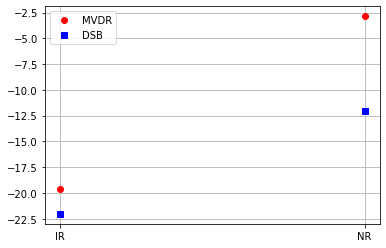

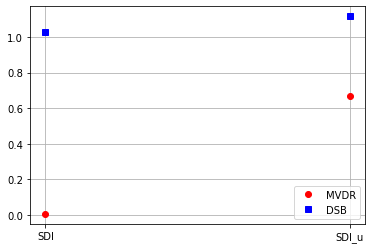

In [38]:
# compute the metrics for dsb0 and mvdr0 (both for env0)
# IR:
x_1_i = stft(env0.intf_mics[0], n_fft=int(env0.os_fft_bins*2-2))
v_1 = stft(env0.noised_mix_mics[0] - env0.source_mics[0] - env0.intf_mics[0]  ,n_fft=int(env0.os_fft_bins*2-2))
x_1_d = stft(env0.source_mics[0], n_fft=int(env0.os_fft_bins*2-2))

dsb0_v_1_hat = dsb0.apply_weights(np.asarray([ stft(sig,n_fft=int(dsb0.env.os_fft_bins*2-2)) for sig in list(dsb0.env.noised_mix_mics -  env0.source_mics - env0.intf_mics)]))
dsb0_x_1_i_hat = dsb0.apply_weights(np.asarray([ stft(sig,n_fft=int(dsb0.env.os_fft_bins*2-2)) for sig in list(dsb0.env.intf_mics)]))
dsb0_x_1_d_hat = dsb0.apply_weights(np.asarray([ stft(sig,n_fft=int(dsb0.env.os_fft_bins*2-2)) for sig in list(dsb0.env.source_mics)]))

mvdr0_v_1_hat = mvdr0.apply_weights(np.asarray([ stft(sig,n_fft=int(mvdr0.env.os_fft_bins*2-2)) for sig in list(mvdr0.env.noised_mix_mics -  env0.source_mics - env0.intf_mics)]))
mvdr0_x_1_i_hat = mvdr0.apply_weights(np.asarray([ stft(sig,n_fft=int(mvdr0.env.os_fft_bins*2-2)) for sig in list(mvdr0.env.intf_mics)]))
mvdr0_x_1_d_hat = mvdr0.apply_weights(np.asarray([ stft(sig,n_fft=int(mvdr0.env.os_fft_bins*2-2)) for sig in list(mvdr0.env.source_mics)]))

dsb_res = []
dsb_res.append(compute_metric(dsb0_x_1_i_hat, x_1_i, 'IR'))
dsb_res.append(compute_metric(dsb0_v_1_hat, v_1, 'NR'))
dsb_res.append(compute_metric(dsb0_x_1_d_hat - x_1_d, x_1_d, 'SDI'))
dsb_res.append(compute_metric(dsb0_x_1_i_hat - x_1_i, x_1_i, 'SDI'))


mvdr_res = []
mvdr_res.append(compute_metric(mvdr0_x_1_i_hat, x_1_i, 'IR'))
mvdr_res.append(compute_metric(mvdr0_v_1_hat, v_1, 'NR'))
mvdr_res.append(compute_metric(mvdr0_x_1_d_hat - x_1_d, x_1_d, 'SDI'))
mvdr_res.append(compute_metric(mvdr0_x_1_i_hat - x_1_i, x_1_i, 'SDI'))
plt.figure()
plt.plot(['IR', 'NR'], mvdr_res[:2], 'ro', label = 'MVDR')
plt.plot(['IR', 'NR'], dsb_res[:2], 'bs', label = 'DSB')
plt.grid()
plt.legend()

plt.figure()
plt.plot([ 'SDI', 'SDI_u'], mvdr_res[2:], 'ro', label = 'MVDR')
plt.plot([ 'SDI', 'SDI_u'], dsb_res[2:], 'bs', label = 'DSB')
plt.grid()
plt.legend()

<div class="alert alert-block alert-info">
<b>Lab Experiment 15</b><br>
Inspect the evaluation. Which beamformer is better for noise reduction and which one for interference reduction. Is the result consistent with Homework 1? If not, why not?
</div>

In [39]:
# this is an external function
from lab_helper import visualize_mvdr_power_pattern

<div class="alert alert-block alert-info">
<b>Lab Experiment 16</b><br>
Inspect the power pattern of the MVDR over time and frequency. Compare the MVDR to the DSB patterns.
</div>

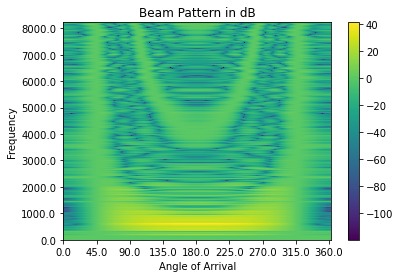

Button(description='Beam-Sweep', style=ButtonStyle())

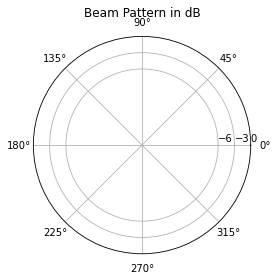

interactive(children=(Dropdown(description='Hz', options=(0.0, 250.0, 500.0, 750.0, 1000.0, 1250.0, 1500.0, 17…

In [40]:
plt.close('all')
# MVDR power pattern for a fixed time frame
visualize_mvdr_power_pattern(mvdr0, 300, compute_RTF_for_freq, compute_doa, compute_tdoa, compute_tdoas)

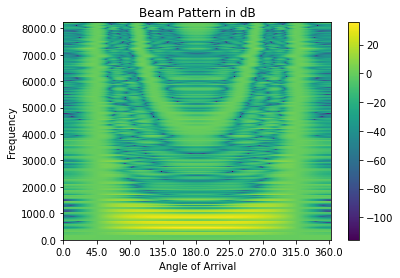

Button(description='Beam-Sweep', style=ButtonStyle())

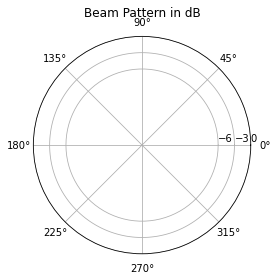

interactive(children=(Dropdown(description='Hz', options=(0.0, 250.0, 500.0, 750.0, 1000.0, 1250.0, 1500.0, 17…

In [41]:
# MVDR power pattern for a fixed frequency (only second plot)
visualize_mvdr_power_pattern(mvdr0, 250, compute_RTF_for_freq, compute_doa, compute_tdoa, compute_tdoas, f_ind = 8000)

# LAB Extension - listen to some other Beamformers (just for interested Students):
- Parametric Multi-Channel Wiener Filter
    - Is a combination of an MVDR and a subsequent Postfilter (Wiener Filter)
    - More noise reduction but also more speech distortion

- Linear-constrained Minimum Variance Distortionless Response (LCMV) Filter
    - Has an additional constrained to remove a undesired source (here second speaker)
    - Worse noise reduction than MVDR

 ... for more information visit the <b>Speech Enhancement Course</b>! ... or ask ;)

## LCMV

In [42]:
class LCMV(Beamformer):

    def __init__(self, env):
        super().__init__(env)
        self.weights=None

    def compute_weights(self, RTF_vecs, RTF_vecs_noise, Phi_u, factor = 1e-5):
        inv_PSD = np.linalg.inv(Phi_u)
        C_array = np.stack((RTF_vecs,RTF_vecs_noise),axis=-1)
        C_array_H = np.conj(np.swapaxes(C_array,-1,-2))
        first_term = inv_PSD@C_array[None,...]
        second_term = C_array_H[None,...]@first_term
        second_term = self.diagonal_loading(second_term, factor)
        s_inv = np.linalg.inv(second_term)[...,0][...,None]
        h_lcmv = first_term@s_inv
        self.weights = h_lcmv[...,0]
        return

    def diagonal_loading(self, matrix, factor = 1e-2):
        eye_mat = np.zeros_like(matrix)
        idx = np.arange(matrix.shape[-1])
        eye_mat[..., idx, idx] = 1
        return matrix + factor*eye_mat

    def apply_weights(self, y):
        return np.sum(np.conj(self.weights.T)*y, axis = 0)

In [43]:
lcmv0 = LCMV(env0)
mask = compute_masks(lcmv0.env.source_mics, lcmv0.env.noise + lcmv0.env.intf_mics, lcmv0.env)
psd = compute_psd_all(mask, np.asarray([ stft(sig,n_fft=int(lcmv0.env.os_fft_bins*2-2)) for sig in list(lcmv0.env.noised_mix_mics)]), lcmv0.env)
RTF_vecs = compute_RTF_vector(lcmv0.env.s, lcmv0.env.ULA_center, lcmv0.env.ULA_direction, lcmv0.env.freqs, lcmv0.env.d, lcmv0.env.c, lcmv0.env.N)
# RTF_vecs = covariance_substraction(psdy, psd)
RTF_vecs_noise = compute_RTF_vector(lcmv0.env.intf, lcmv0.env.ULA_center, lcmv0.env.ULA_direction, lcmv0.env.freqs, lcmv0.env.d, lcmv0.env.c, lcmv0.env.N)
lcmv0.compute_weights(RTF_vecs,RTF_vecs_noise, psd)
result = lcmv0.apply_weights(np.asarray([ stft(sig,n_fft=int(lcmv0.env.os_fft_bins*2-2)) for sig in list(lcmv0.env.noised_mix_mics)]))

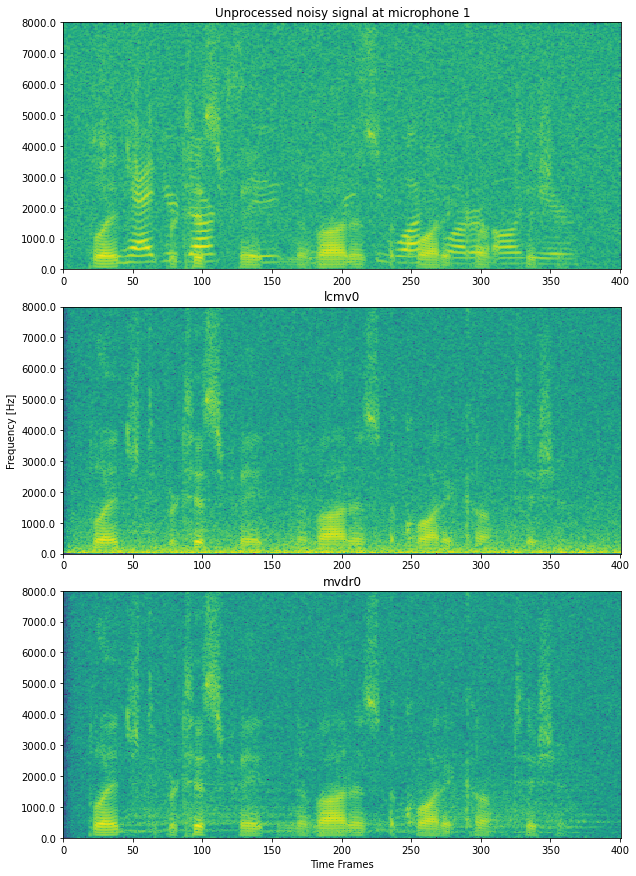

Unprocessed noisy signal at microphone 1


lcmv0


mvdr0


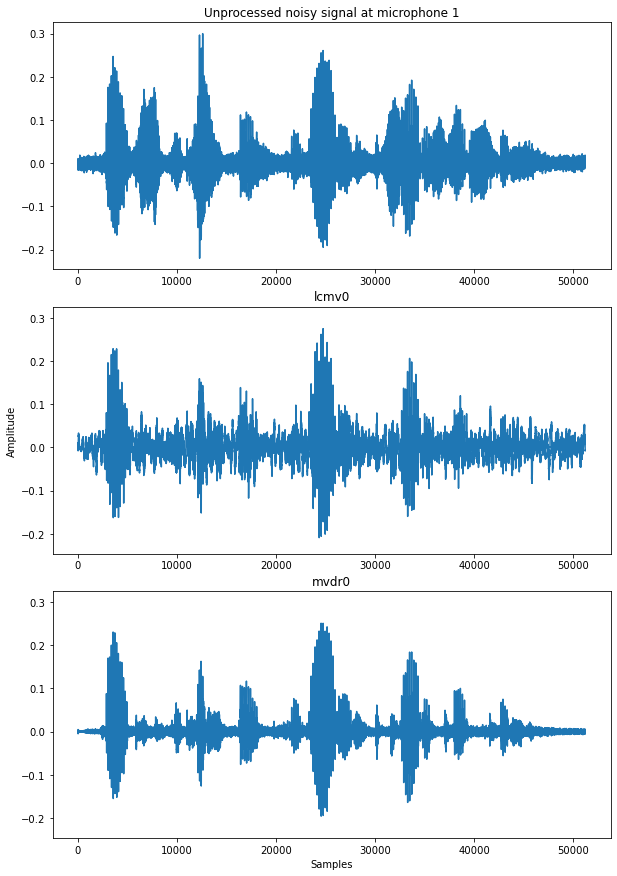

In [44]:
evaluate_beamformers(lcmv0, 'lcmv0', mvdr0, 'mvdr0')

# LCMV plus Wiener Postfilter

In [45]:
class LCMV_PWF(Beamformer):
    def __init__(self, env):
        super().__init__(env)
        self.weights=None
        self.LCMV = LCMV(env)

    def compute_weights(self, RTF_vecs, RTF_vecs_u, Phi_x, Phi_u, mu, h_min = 4*1e-1):
        self.LCMV.compute_weights(RTF_vecs, RTF_vecs_u, Phi_u)
        h_lcmv = self.LCMV.weights
        phi_x = np.real(np.conj(h_lcmv[...,None,:])@Phi_x@h_lcmv[...,None])
        phi_u = np.real(np.conj(h_lcmv[...,None,:])@Phi_u@h_lcmv[...,None])
        h_w = phi_x/(phi_x+ mu*phi_u)
        h_w[h_w<h_min] = h_min
        self.weights = h_w[...,0]*h_lcmv
        return

    def apply_weights(self, y):
        return np.sum(np.conj(self.weights.T)*y, axis = 0)

In [46]:
lcmv_pwf = LCMV_PWF(env0)
mask = compute_masks(lcmv_pwf.env.source_mics, lcmv_pwf.env.noise + lcmv_pwf.env.intf_mics, lcmv_pwf.env)
psd = compute_psd_all(mask, np.asarray([ stft(sig,n_fft=int(lcmv_pwf.env.os_fft_bins*2-2)) for sig in list(lcmv_pwf.env.noised_mix_mics)]), lcmv_pwf.env)
y = np.asarray([ stft(sig,n_fft=int(lcmv_pwf.env.os_fft_bins*2-2)) for sig in list(lcmv_pwf.env.noised_mix_mics)]).T
psdy = y[...,None]@np.conj(y[...,None,:])
psdx =  psdy - psd
RTF_vecs = compute_RTF_vector(lcmv_pwf.env.s, lcmv_pwf.env.ULA_center, lcmv_pwf.env.ULA_direction, lcmv_pwf.env.freqs, lcmv_pwf.env.d, lcmv_pwf.env.c, lcmv_pwf.env.N)
#RTF_vecs = covariance_substraction(psdy, psd)
RTF_vecs_noise = compute_RTF_vector(lcmv_pwf.env.intf, lcmv_pwf.env.ULA_center, lcmv_pwf.env.ULA_direction, lcmv_pwf.env.freqs, lcmv_pwf.env.d, lcmv_pwf.env.c, lcmv_pwf.env.N)
lcmv_pwf.compute_weights(RTF_vecs, RTF_vecs_noise,psdx, psd,1)
result = lcmv_pwf.apply_weights(np.asarray([ stft(sig,n_fft=int(lcmv_pwf.env.os_fft_bins*2-2)) for sig in list(lcmv_pwf.env.noised_mix_mics)]))

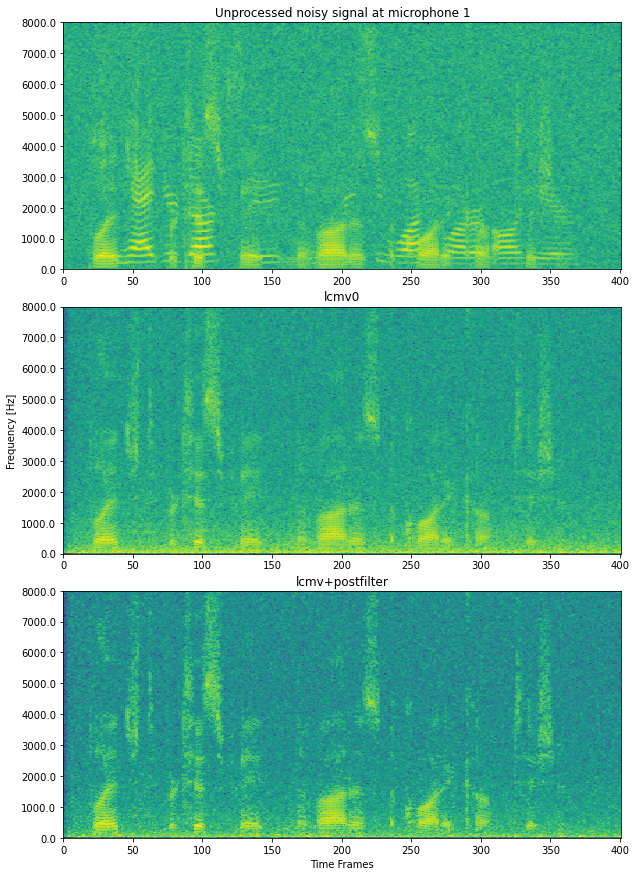

Unprocessed noisy signal at microphone 1


lcmv0


lcmv+postfilter


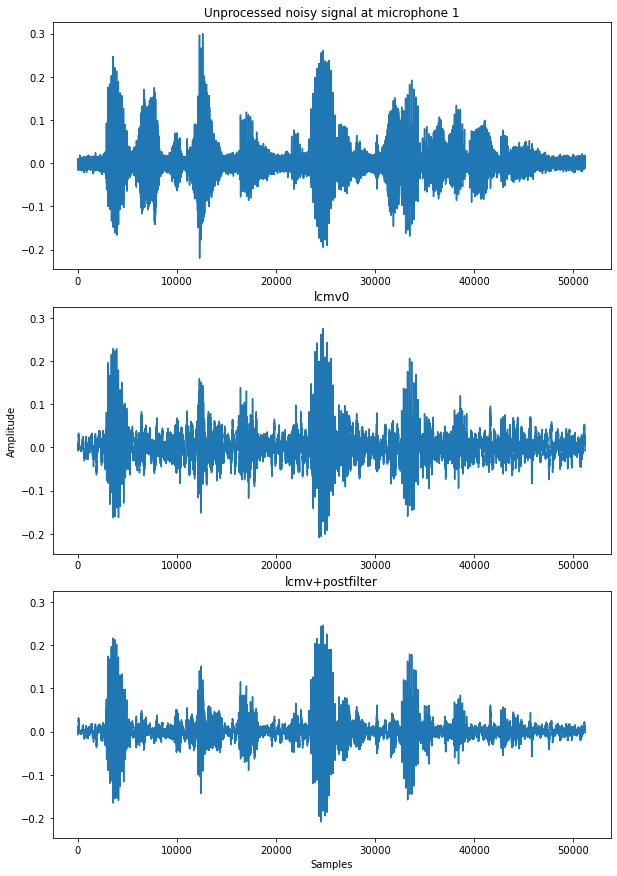

In [47]:
evaluate_beamformers(lcmv0, 'lcmv0', lcmv_pwf, 'lcmv+postfilter')

# PMCWF

In [48]:
class PMCWF(Beamformer):
    def __init__(self, env):
        super().__init__(env)
        self.weights=None
        self.MVDR = MVDR(env)

    def compute_weights(self, RTF_vecs, Phi_x, Phi_u, mu, h_min = 0.4):
        self.MVDR.compute_weights(RTF_vecs, Phi_u)
        h_mvdr = self.MVDR.weights
        phi_x = np.real(np.conj(h_mvdr[...,None,:])@Phi_x@h_mvdr[...,None])
        phi_u = np.real(np.conj(h_mvdr[...,None,:])@Phi_u@h_mvdr[...,None])
        h_w = phi_x/(phi_x+ mu*phi_u)
        h_w[h_w<h_min] = h_min
        self.weights = h_w[...,0]*h_mvdr
        return

    def apply_weights(self, y):
        return np.sum(np.conj(self.weights.T)*y, axis = 0)


pmcwf = PMCWF(env0)
mask = compute_masks(pmcwf.env.source_mics, pmcwf.env.noise + pmcwf.env.intf_mics, pmcwf.env)
psd = compute_psd_all(mask, np.asarray([ stft(sig,n_fft=int(pmcwf.env.os_fft_bins*2-2)) for sig in list(pmcwf.env.noised_mix_mics)]), pmcwf.env)
y = np.asarray([ stft(sig,n_fft=int(pmcwf.env.os_fft_bins*2-2)) for sig in list(pmcwf.env.noised_mix_mics)]).T
psdy = y[...,None]@np.conj(y[...,None,:])
psdx =  psdy - psd
RTF_vecs = compute_RTF_vector(pmcwf.env.s, pmcwf.env.ULA_center, pmcwf.env.ULA_direction, pmcwf.env.freqs, pmcwf.env.d, pmcwf.env.c, pmcwf.env.N)
#RTF_vecs = covariance_substraction(psdy, psd)
RTF_vecs_noise = compute_RTF_vector(pmcwf.env.intf, pmcwf.env.ULA_center, pmcwf.env.ULA_direction, pmcwf.env.freqs, pmcwf.env.d, pmcwf.env.c, pmcwf.env.N)
pmcwf.compute_weights(RTF_vecs,psdx, psd,1)
result = pmcwf.apply_weights(np.asarray([ stft(sig,n_fft=int(pmcwf.env.os_fft_bins*2-2)) for sig in list(pmcwf.env.noised_mix_mics)]))

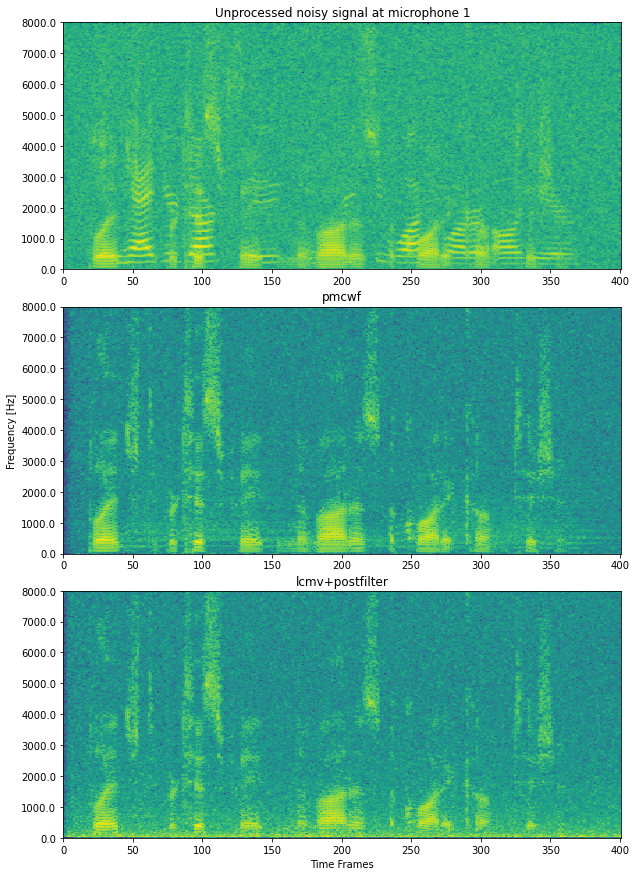

Unprocessed noisy signal at microphone 1


pmcwf


lcmv+postfilter


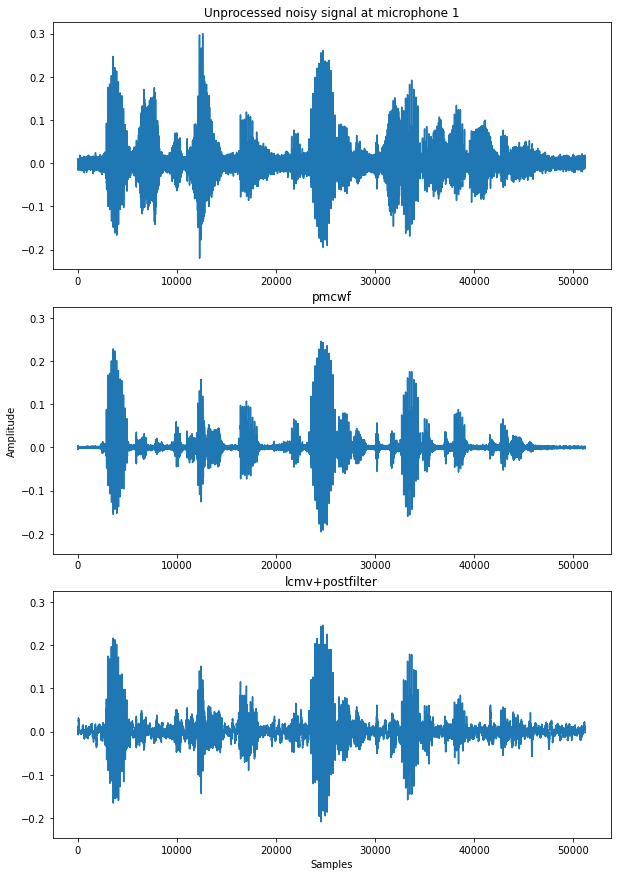

In [49]:
evaluate_beamformers(pmcwf, 'pmcwf', lcmv_pwf, 'lcmv+postfilter')

# Problem:
We still use the ground truth DOA ... what happens if we estimate it?

You can replace the RTF vector estimation by: